In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs = 8 # batch size
version = 1

In [ ]:
!pip install -Uqq fastai

In [ ]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [ ]:
%cd /content/drive/MyDrive/Vispol_classify

/content/drive/MyDrive/Vispol_classify


In [ ]:
data_path = "data"
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files,                        # get_image_files returns a list of all images in that path recursively by default
    splitter=RandomSplitter(valid_pct=0.1, seed=42),  # getting 90-10 train-validation split
    get_y=parent_label,                               # taking the folder name as labels
    item_tfms=Resize(256))                            # resizing to get the image of same shape

In [ ]:
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs)
torch.save(dls, f"dataloaders/vispol_dataloader_v{version}.pkl")

In [ ]:
# dls.train.show_batch(max_n=4, nrows=2)

In [ ]:
# dls.valid.show_batch(max_n=4, nrows=2)

In [ ]:
model_path = "models"
model = vision_learner(dls, resnet50, metrics=[error_rate,accuracy])
model.fine_tune(15)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.124633,0.558066,0.125000,0.875000,01:18


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.746709,0.275274,0.083333,0.916667,01:15
1,0.590402,0.320464,0.113095,0.886905,01:15
2,0.646699,0.320245,0.077381,0.922619,01:15
3,0.735143,0.344382,0.101190,0.898810,01:18
4,0.623070,0.348245,0.107143,0.892857,01:15
5,0.460583,0.255258,0.083333,0.916667,01:15
6,0.404178,0.353504,0.101190,0.898810,01:15
7,0.401477,0.385046,0.113095,0.886905,01:15
8,0.343400,0.303038,0.077381,0.922619,01:19
9,0.304432,0.236062,0.059524,0.940476,01:15


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should b

In [ ]:
import os
os.remove("/content/drive/MyDrive/Vispol_classify/data/graffiti/18fcae41-4a39-4eee-82fc-61dc722368ce.jpg") 

In [ ]:
model.save(f"vispol-recognizer-v{version}")

Path('models/vispol-recognizer-v0.pth')

/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


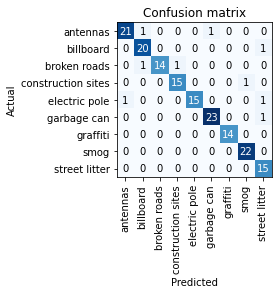

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

In [ ]:
#street litter, half built architecture, grafiti, broken roads 

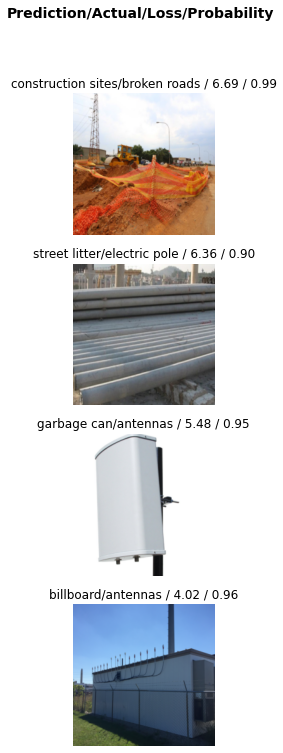

In [ ]:
interp.plot_top_losses(4, nrows=4)

In [ ]:
cleaner = ImageClassifierCleaner(model)
cleaner #street litter, half built architecture, grafiti, broken roads 

/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.8/dist-packages/PIL/Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    # delete irrelevant data
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}") # change the directory

In [ ]:
model.export(f"{model_path}/vispol-1-recognizer-v{version}.pkl")